# <div style="color:#fff;display:fill;border-radius:10px;background-color:#137aa4;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:40px;color:white;overflow:hidden;margin:0;font-size:100%"> Rendu code projet décisionnel - Final - Groupe 1 </div>
This notebook is a concise and comprehensive representation of the code we have developed for our decision-making project. It contains the final result of our analysis and presents our findings in a clear and organized manner. We have carefully selected the most relevant parts of our code and condensed them into this notebook, making it easier for others to follow our reasoning and replicate our analysis.

We decided to centralize our code on Kaggle notebooks to allow for greater adaptability and collaboration, as well as easy accessibility for corrections. 


# <div style="color:#fff;display:fill;border-radius:10px;background-color:#3c968b;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:20px;color:white;overflow:hidden;margin:0;font-size:100%"> 📋 Table of Contents</div>

* [Libraries](#section-1)
* [Data Loading](#section-2)
* [EDA](#section-3)
* [Data Cleaning](#section-4) 
* [AutoML](#section-5)
* [Predictions](#section-6) 
* [Save](#section-7) 

<a id="section-1"></a>
# <div style="color:#fff;display:fill;border-radius:10px;background-color:#3c968b;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:20px;color:white;overflow:hidden;margin:0;font-size:100%"> 📖 Libraries and color palette</div> 

In [6]:
!pip install xlrd
!pip install pip install autoviz --upgrade
!pip install -U ydata-profiling
!pip install dataprep
!pip install datacleaner
!pip install pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 21.3 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.4/67.4 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 65.0 MB/s eta 0:00:00:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 63.4 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 22.3.1
    Uninstalling pip-22.3.1:
      Successfully uninstalled pip-22.3.1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.9/345.9 kB 6.9 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 49.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 45.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 61.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.2/78.2 kB 8.8 MB/s

In [7]:
# import the necessary libraries
import pandas as pd
import numpy as np
from scipy import stats

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

import matplotlib.pyplot as plt
import seaborn as sns

#from pandas_profiling.model.base import get_var_type
from ydata_profiling import ProfileReport
from autoviz.AutoViz_Class import AutoViz_Class
from autoviz import data_cleaning_suggestions
from dataprep.clean import clean_df
from datacleaner import autoclean, autoclean_cv

from sklearn.metrics import confusion_matrix
from h2o import h2o
from h2o.automl import H2OAutoML
from sklearn.metrics import classification_report

Imported v0.1.601. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


<a id="section-3"></a>
# <div style="color:#fff;display:fill;border-radius:10px;background-color:#3c968b;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:20px;color:white;overflow:hidden;margin:0;font-size:100%">⬇️ Data Loading</div> 

As part of our research for the hackathon, we downloaded relevant data from the CELENE server and loaded it into our notebook. This allowed us to analyze the data and gain insights that informed our project plan and execution. 

In [8]:
# Paths
train_path = '/kaggle/input/real-estate-sales-in-paris-with-building-data-v2/75_solution.csv'

# Read the data into a dataframe from the csv files [delimited by ; = sep=';']
train = pd.read_csv(train_path)

In [9]:
habitant = pd.read_csv('/kaggle/input/communes-france/Communes.csv', sep=';')
# Import the csv file "data/valeurs_mensuelles.csv" in a dataframe inflation with ignore the lines 2,3,4
inflation = pd.read_csv('/kaggle/input/inflation/valeurs_mensuelles.csv', sep=';')

In [11]:
# Variable declaration
TARGET = 'valeurfonc'
TARGET2 = 'valeur_fonciere'

In [6]:
# Show the shape of the train and test dataframes
print("Train shape : "+train.shape.__str__())

Train shape : (357332, 343)


In [7]:
# Show columns of the train and test
print("Train columns : "+train.columns.__str__())

Train columns : Index(['fid', 'idmutation', 'idmutinvar', 'idopendata', 'idnatmut',
       'codservch', 'refdoc', 'datemut', 'anneemut', 'moismut',
       ...
       'rnc_ope_l_annee_construction', 'rnc_ope_nb_lot_garpark',
       'rnc_ope_nb_lot_tot', 'rnc_ope_nb_log', 'rnc_ope_nb_lot_tertiaire',
       'rnc_ope_l_nom_copro', 'nb_commerces_100m', 'nb_commerces_500m',
       'latidude', 'longitude'],
      dtype='object', length=343)


<a id="section-2"></a>
# <div style="color:#fff;display:fill;border-radius:10px;background-color:#3c968b;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:20px;color:white;overflow:hidden;margin:0;font-size:100%">💹 Exploratory data analysis</div> 


    Since nrows is smaller than dataset, loading random sample of 150000 rows into pandas...
Shape of your Data Set loaded: (150000, 343)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
argiles_alea,100.000000,0.000000,float64,0,10000,0.000000,"fill missing values, very high nulls percent: drop"
dpe_arrete_2021_surface_vitree_horizontal,100.000000,0.000000,float64,0,10000,0.000000,"fill missing values, very high nulls percent: drop"
hthd_l_nom_pdl,100.000000,0.000000,float64,0,10000,0.000000,"fill missing values, very high nulls percent: drop"
codservch,100.000000,0.000000,float64,0,10000,0.000000,"fill missing values, very high nulls percent: drop"
refdoc,100.000000,0.000000,float64,0,10000,0.000000,"fill missing values, very high nulls percent: drop"
bdtopo_equ_l_nature_detaillee,100.000000,0.000000,object,0,10000,nan,"fill missing values, very high nulls percent: drop"
bdtopo_equ_l_toponyme,99.980000,0.010000,object,1,9998,2.000000,"fill missing values, invariant values: drop, very high nulls percent: drop, fix mixed data types"
bdtopo_equ_l_nature,99.980000,0.010000,object,1,9998,2.000000,"fill missing values, invariant values: drop, very high nulls percent: drop, fix mixed data types"
dpe_logtype_enr,99.820000,0.020000,object,2,9982,4.000000,"fill missing values, very high nulls percent: drop, fix mixed data types"
dpe_arrete_2021_type_generateur_ecs_anciennete_appoint,99.610000,0.040000,object,4,9961,5.000000,"fill missing values, very high nulls percent: drop, fix mixed data types"


    342 Predictors classified...
        52 variables removed since they were ID or low-information variables
        List of variables removed: ['fid', 'idmutation', 'idmutinvar', 'idopendata', 'codservch', 'refdoc', 'coddep', 'code_departement_insee', 'code_commune_insee', 'libelle_commune_insee', 'code_epci_insee', 'argiles_alea', 'bdtopo_equ_l_nature', 'bdtopo_equ_l_nature_detaillee', 'bdtopo_equ_l_toponyme', 'bdtopo_zoa_l_nature', 'bdtopo_zoa_l_nature_detaillee', 'bdtopo_zoa_l_toponyme', 'dle_2020_gaz_conso_pro_par_pdl', 'dle_2020_reseaux_conso_res_par_pdl', 'dle_2020_reseaux_conso_pro_par_pdl', 'dle_2020_reseaux_conso_tot_par_pdl', 'dle_2020_reseaux_identifiant_reseau', 'dle_2020_reseaux_type_reseau', 'dpe_logtype_avancee_masque_max', 'dpe_logtype_ch_gen_lib_appoint', 'dpe_logtype_ch_solaire', 'dpe_logtype_ecs_gen_lib_appoint', 'dpe_logtype_enr', 'dpe_arrete_2021_nombre_niveau_immeuble', 'dpe_arrete_2021_type_energie_chauffage_appoint', 'dpe_arrete_2021_type_generateur_chauffage_

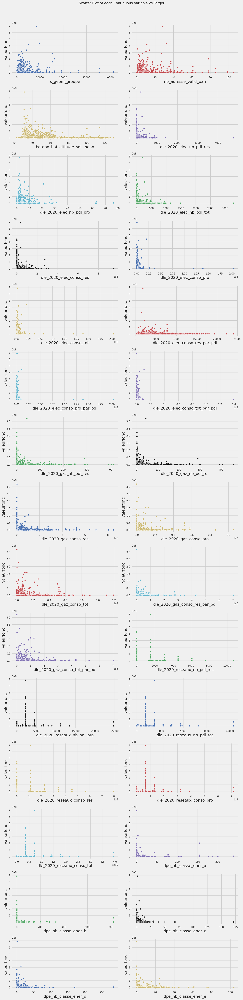

Number of All Scatter Plots = 465
Could not draw Pair Scatter Plots


ValueError: Image size of 1500x87200 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1500x87200 with 435 Axes>

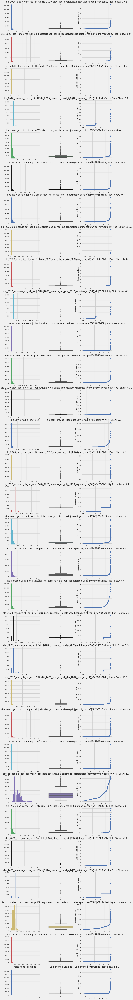

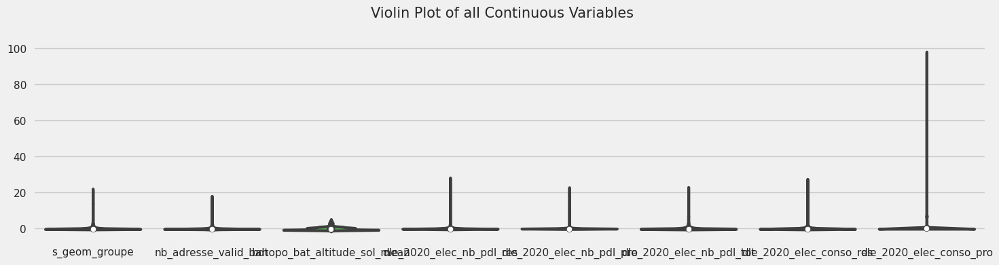

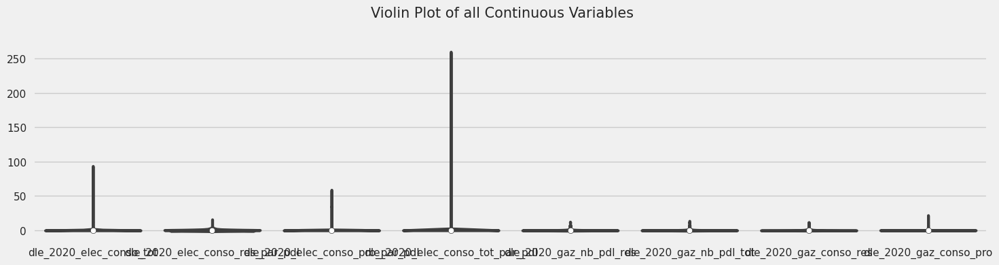

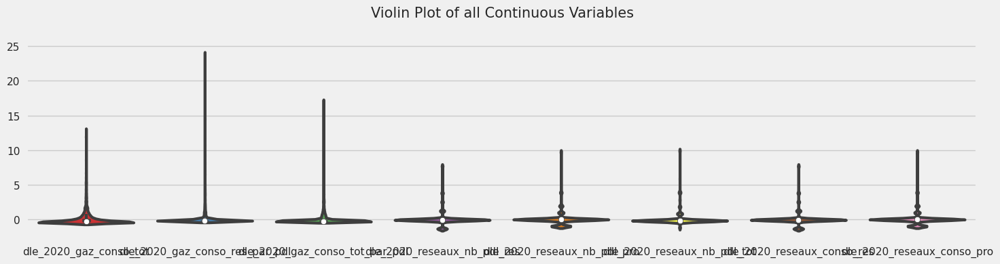

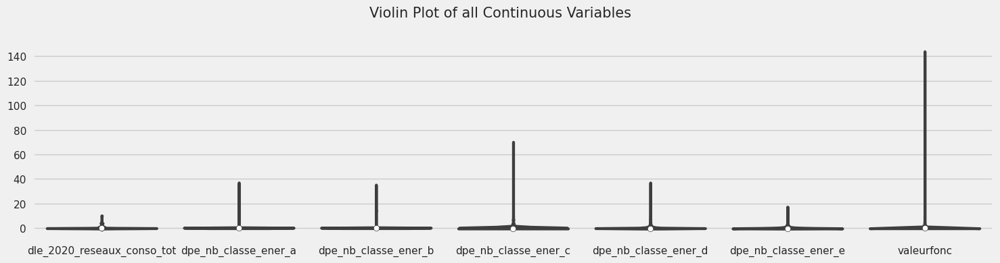

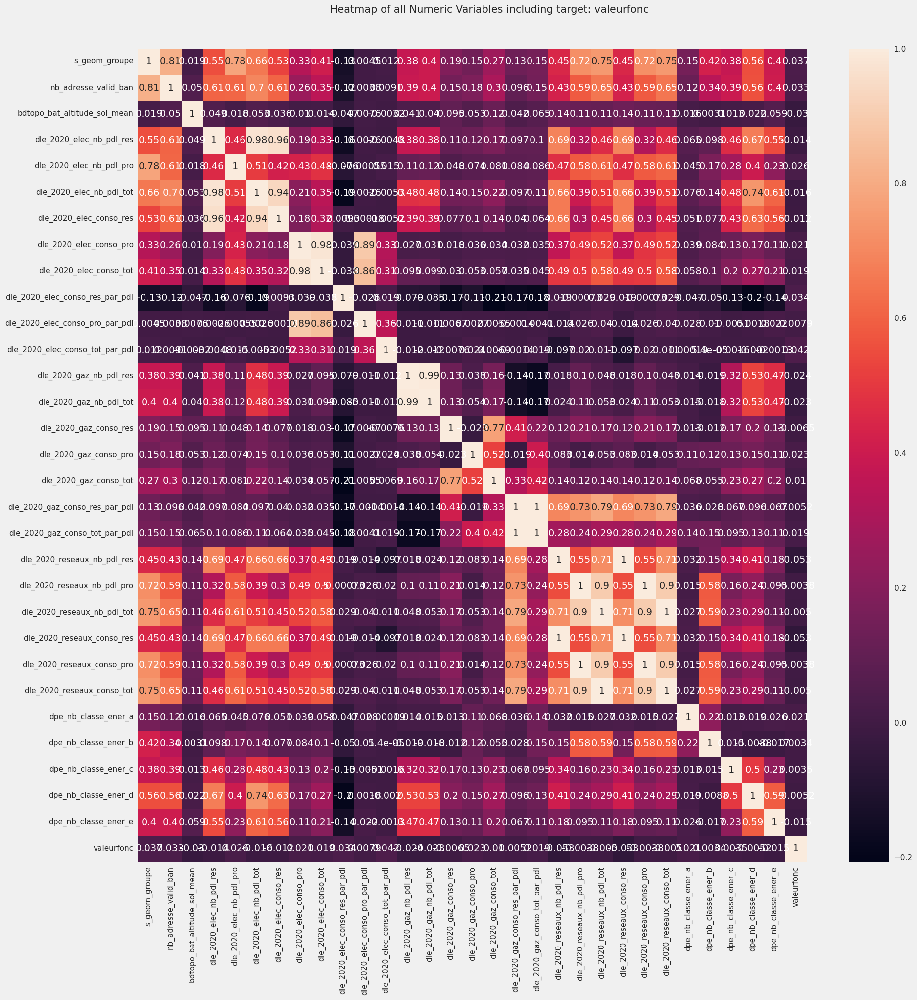

All Plots done
Time to run AutoViz = 111 seconds 

 ###################### AUTO VISUALIZATION Completed ########################
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


In [ ]:
%matplotlib inline
AV = AutoViz_Class()
# Use the AutoViz class to generate a report on the dataframe
# # filename = AV.AutoViz(filename='', depVar=TARGET, dfte=train, chart_format='bokeh')
filename = AV.AutoViz(filename='', depVar=TARGET, dfte=train)
data_cleaning_suggestions(train)

In [9]:
 data_profile_train = ProfileReport(train, title='Paris Train data Profile Report',dark_mode=True, minimal=True, correlations={
         "auto": {"calculate": True}
     },)

In [10]:
# data_profile_train.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# AV = AutoViz_Class()
# # Use the AutoViz class to generate a report on the dataframe
# filename = AV.AutoViz(filename='', depVar=TARGET, dfte=train)

In [78]:
# make sure train['codtypbien'] is a string type
train['codtypbien'] = train['codtypbien'].astype(str)

# drop all rows with codtypbien not beginning with 11 and 12
train = train[train['codtypbien'].str.startswith(('11', '12'))]
# train = train[train['codtypbien'].str.startswith(('12'))]

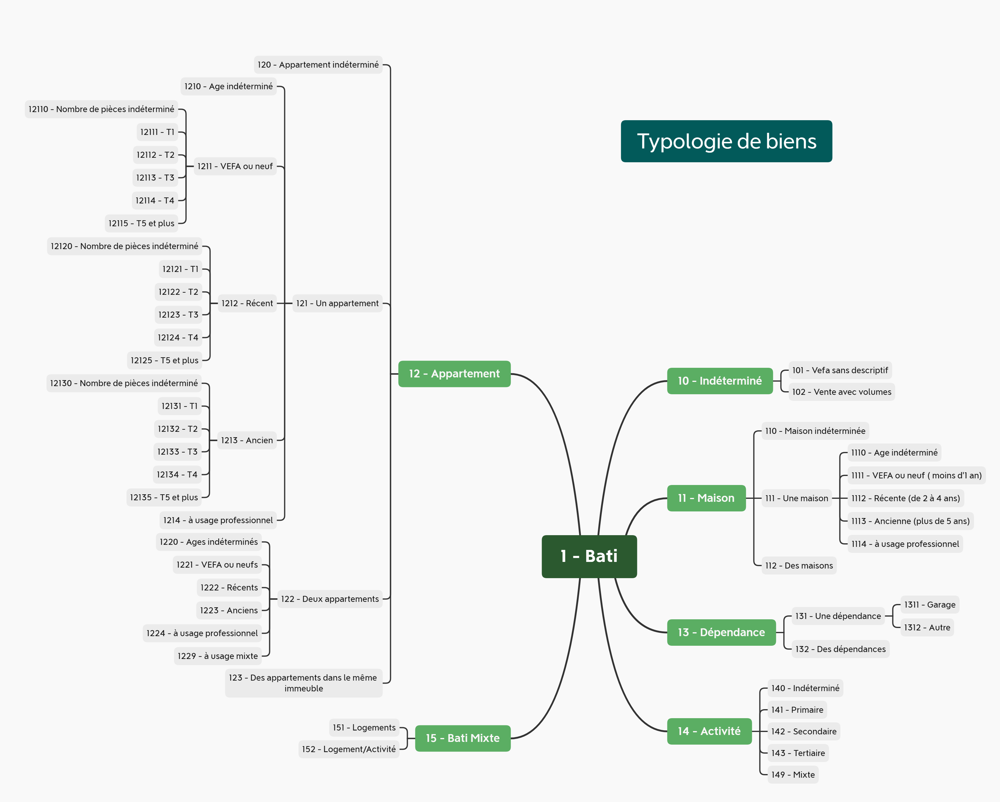

In [9]:
print("Nombre de lignes : ", len(train))

Nombre de lignes :  277855


In [79]:
train = train[train['libnatmut'] == 'Vente']
# Drop all the values with a different value of nblot = 0 or 1
train = train[train['nblot'].isin([1])]
# Drop surface_bati = 0
train = train[train['sbati'] > 10]
# Drop valeur_fonciere < 10000
train = train[train['valeurfonc'] > 10000]

In [11]:
print("Nombre de lignes : ", len(train))

Nombre de lignes :  87362


In [80]:
inflation.drop(inflation.index[[0,1,2]], inplace=True)
inflation = inflation.rename(columns={'Indice des prix dans la grande distribution - Base 2015 - Ensemble des ménages - France métropolitaine - Toutes formes de vente': 'inflation'})

In [81]:
# convert the column "datemut" in datetime
train['datemut'] = pd.to_datetime(train['datemut'])
# convert the column "Libellé" in datetime
inflation['Libellé'] = pd.to_datetime(inflation['Libellé'])

In [14]:
print("Nombre de lignes : ", len(train))

Nombre de lignes :  87362


In [82]:
inflation = inflation.drop(['Codes'], axis=1)

# create a new column "yearmonth" in the dataframe geomut with the year and month of the column "datemut"
train['yearmonth'] = train['datemut'].dt.to_period('M')
# create a new column "yearmonth" in the dataframe inflation with the year and month of the column "Libellé"
inflation['yearmonth2'] = inflation['Libellé'].dt.to_period('M')
# drop the column "Libellé"
inflation = inflation.drop(['Libellé'], axis=1)
# Fill NaN values in the column "inflation" by a regression
inflation['inflation'] = inflation['inflation'].fillna(method='ffill')

# merge the two dataframes on the column "datemut" = "Libellé" by year and month
train = pd.merge(train, inflation, left_on='yearmonth', right_on='yearmonth2', how='left')
# drop the column "yearmonth2"
train = train.drop(['yearmonth2'], axis=1)
# drop the column "yearmonth"
train = train.drop(['yearmonth'], axis=1)

In [16]:
print("Nombre de lignes : ", len(train))

Nombre de lignes :  87362


In [83]:
# delete all the "[" and "]" characters of the column "l_codinsee"
train['l_codinsee'] = train['l_codinsee'].str.replace('[', '')
train['l_codinsee'] = train['l_codinsee'].str.replace(']', '')
# delete all the "'" characters of the column "l_codinsee"
train['l_codinsee'] = train['l_codinsee'].str.replace("'", '')
train['code_commune'] = train['l_codinsee'].str.split(',').str[0]

# drop the column "l_codinsee"
train = train.drop(['l_codinsee'], axis=1)

In [84]:
train['code_commune'] = train['code_commune'].astype(str)
habitant['DEPCOM'] = habitant['DEPCOM'].astype(str)

habitant = habitant[['DEPCOM', 'PMUN', 'COM']]
train = pd.merge(train, habitant, left_on='code_commune', right_on='DEPCOM', how='inner')

train = train.drop(['DEPCOM'], axis=1)
# Rename PMUN by nb_habitants and COM by nom_commune
train = train.rename(columns={'PMUN': 'nb_habitants', 'COM': 'nom_commune'})
# rename the column "libnatmut" by "nature_mutation", "datemut" by "date_mutation", "valeurfonc" by "valeur_fonciere", "sbati" by "surface_bati", "sterr" by "surface_terrain", "libtypbien" by "type_local"
train = train.rename(columns={'libnatmut': 'nature_mutation', 'datemut': 'date_mutation', 'valeurfonc': 'valeur_fonciere', 'sbati': 'surface_bati', 'sterr': 'surface_terrain', 'libtypbien': 'type_local'})

In [54]:
print("Nombre de lignes : ", len(train_selected))

Nombre de lignes :  5809


In [85]:
# creation d'une nouvelle colonne avec le prix au m2 de chaque mutation
train['prix_m2'] = train[TARGET2] / train['surface_bati']
# Pour chaque nom_commune, on calcule le zscore de la colonne prix_m2
train['zscore'] = train.groupby('code_commune_insee')['prix_m2'].transform(lambda x: stats.zscore(x))

In [86]:
print("Nombre de lignes avant suppression des outliers : ", len(train))
# On supprime les lignes qui ont un zscore > 4 ou < -0.5
train = train[(train['zscore'] < 4) & (train['zscore'] > -0.8)]
print("Nombre de lignes après suppression des outliers : ", len(train))

Nombre de lignes avant suppression des outliers :  92546
Nombre de lignes après suppression des outliers :  77973


In [87]:
train['nbmaipp'] = train['nbmai1pp'] + train['nbmai2pp'] + train['nbmai3pp'] + train['nbmai4pp'] + train['nbmai5pp']
train = train.drop(['nbmai1pp', 'nbmai2pp', 'nbmai3pp','nbmai4pp', 'nbmai5pp'], axis=1)
train['saptpp'] = train['sapt1pp'] + train['sapt2pp'] + train['sapt3pp'] + train['sapt4pp'] + train['sapt5pp']
train = train.drop(['sapt1pp', 'sapt2pp', 'sapt3pp','sapt4pp', 'sapt5pp'], axis=1)
train['nbaptpp'] = train['nbapt1pp'] + train['nbapt2pp'] + train['nbapt3pp'] + train['nbapt4pp'] + train['nbapt5pp']
train = train.drop(['nbapt1pp', 'nbapt2pp', 'nbapt3pp','nbapt4pp', 'nbapt5pp'], axis=1)
train['smaipp'] = train['smai1pp'] + train['smai2pp'] + train['smai3pp'] + train['smai4pp'] + train['smai5pp']
train = train.drop(['smai1pp', 'smai2pp', 'smai3pp','smai4pp', 'smai5pp'], axis=1)

In [129]:
train_min = train[['date_mutation', 'anneemut', 'moismut', 'coddep', 'nature_mutation',
       'valeur_fonciere', 'nblot', 'nbcomm', 'nbsection', 'nbpar', 'nbparmut',
       'nbsuf', 'surface_terrain', 'nbvolmut', 'nblocmut', 'nblocmai',
       'nblocapt', 'nblocdep', 'nblocact', 'nbaptpp', 'surface_bati', 'sbatmai', 'sbatapt', 'sbatact',
       'saptpp', 'smaipp', 'codtypbien', 'type_local',
       'code_commune', 'inflation', 'nb_habitants', 'nom_commune', 'nb_commerces_100m', 'nb_commerces_500m',
       'longitude', 'latitude', 'nbmaipp', 'bdtopo_bat_hauteur_mean',
       'dpe_conso_ener_mean', 'dpe_estim_ges_mean',
       'dpe_logtype_periode_construction', 'ffo_bat_annee_construction',
       'qpv_nom_quartier', 'bdtopo_bat_l_usage_1', 'bdtopo_zoa_l_nature', 'bdtopo_zoa_l_nature_detaillee', 'bdtopo_zoa_l_toponyme', 'dpe_arrete_2021_type_generateur_chauffage_anciennete', 'dpe_arrete_2021_type_energie_chauffage_appoint', 'dpe_arrete_2021_type_generateur_chauffage_appoint', 'dpe_arrete_2021_type_generateur_climatisation', 'dpe_arrete_2021_type_generateur_ecs_anciennete', 'dpe_arrete_2021_surface_habitable_logement', 'dpe_arrete_2021_surface_mur_totale', 'dpe_arrete_2021_surface_mur_exterieur', 'dpe_arrete_2021_surface_mur_deperditif', 'dpe_arrete_2021_surface_plancher_bas_totale', 'dpe_arrete_2021_surface_plancher_haut_totale', 'dpe_arrete_2021_surface_porte', 'dpe_arrete_2021_deperdition_mur', 'dpe_arrete_2021_deperdition_baie_vitree', 'ffo_bat_nb_log']]

In [102]:
train['code_commune'].unique()

array(['75113', '75111', '75119', '75102', '75117', '75115', '75105',
       '75106', '75108', '75112', '75107', '75118', '75109', '75104',
       '75120', '75110', '75101', '75114', '75116', '75103'], dtype=object)

In [106]:
# train_min = train_min[train_min['code_commune'] == '75102']

In [85]:
# train_min = train[['valeurfonc','longitude', 'latidude', 'nb_commerces_100m', 'nb_commerces_500m', 'anneemut', 'sterr', 'nblocmut', 'nblocapt', 'sbati', 'nbapt1pp', 'nbapt2pp', 'nbapt3pp', 'nbapt4pp', 'nbapt5pp', 'sbatmai', 'sbatapt', 'sapt1pp', 'sapt2pp', 'sapt3pp', 'sapt4pp', 'sapt5pp', 'smai1pp', 'smai2pp', 'smai3pp', 'smai4pp', 'smai5pp', 'codtypbien', 'dpe_conso_ener_mean','dpe_estim_ges_mean', 'dpe_logtype_s_hab', 'dpe_arrete_2021_nombre_niveau_immeuble', 'dpe_logtype_periode_construction', 'dpe_arrete_2021_surface_habitable_logement', 'dpe_arrete_2021_surface_mur_totale', 'dpe_arrete_2021_surface_mur_exterieur', 'dpe_arrete_2021_surface_mur_deperditif', 'dpe_arrete_2021_surface_plancher_bas_totale', 'dpe_arrete_2021_surface_plancher_haut_totale', 'dpe_arrete_2021_surface_porte', 'dpe_arrete_2021_deperdition_mur', 'dpe_arrete_2021_deperdition_baie_vitree', 'ffo_bat_nb_log', 'libtypbien', 'bdtopo_bat_l_usage_1', 'bdtopo_zoa_l_nature', 'bdtopo_zoa_l_nature_detaillee', 'bdtopo_zoa_l_toponyme', 'dpe_arrete_2021_type_generateur_chauffage_anciennete', 'dpe_arrete_2021_type_energie_chauffage_appoint', 'dpe_arrete_2021_type_generateur_chauffage_appoint', 'dpe_arrete_2021_type_generateur_climatisation', 'dpe_arrete_2021_type_generateur_ecs_anciennete', 'qpv_nom_quartier']]

In [ ]:
# sample = train_clean.sample(10000)

In [ ]:
# data_profile_train = ProfileReport(sample, title='Paris Train data Profile Report',dark_mode=True, minimal=True, correlations={
#         "auto": {"calculate": True}
#     },)

In [ ]:
# data_profile_train.to_notebook_iframe()

<a id="section-4"></a>
# <div style="color:#fff;display:fill;border-radius:10px;background-color:#3c968b;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:20px;color:white;overflow:hidden;margin:0;font-size:100%">🧹 Data Cleaning</div> 

In [29]:
# # Extract the target from the train dataframe and drop the column
# targets = train_min[TARGET]
# train_min.drop(TARGET, axis=1, inplace=True)

In [107]:
# Show the shape of the train and test dataframes
print("Train shape : "+train_min.shape.__str__())

Train shape : (1978, 62)


In [29]:
data_cleaning_suggestions(train_min)

Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
bdtopo_zoa_l_nature_detaillee,99.527327,0.042720,object,31,72223,1,"combine rare categories, fill missing values, very high nulls percent: drop, fix mixed data types"
bdtopo_zoa_l_nature,99.200728,0.037208,object,27,71986,1,"combine rare categories, fill missing values, very high nulls percent: drop, fix mixed data types"
bdtopo_zoa_l_toponyme,99.200728,0.172257,object,125,71986,1,"combine rare categories, fill missing values, very high nulls percent: drop, fix mixed data types"
dpe_arrete_2021_type_generateur_climatisation,99.050520,0.004134,object,3,71877,8,"fill missing values, very high nulls percent: drop, fix mixed data types"
qpv_nom_quartier,98.041783,0.020671,object,15,71145,2,"fill missing values, very high nulls percent: drop, fix mixed data types"
dpe_arrete_2021_type_energie_chauffage_appoint,97.378938,0.009646,object,7,70664,2,"fill missing values, very high nulls percent: drop, fix mixed data types"
dpe_arrete_2021_type_generateur_chauffage_appoint,97.370669,0.022049,object,16,70658,1,"fill missing values, very high nulls percent: drop, fix mixed data types"
dpe_arrete_2021_type_generateur_ecs_anciennete,81.073781,0.005512,object,4,58832,2037,"fill missing values, fix mixed data types"
dpe_arrete_2021_type_generateur_chauffage_anciennete,76.932723,0.005512,object,4,55827,2859,"fill missing values, fix mixed data types"
dpe_arrete_2021_surface_plancher_bas_totale,47.771684,6.993633,float64,5075,34666,0,"fill missing values, highly right skewed distribution: drop outliers or do box-cox transform"


In [130]:
# drop the column with invariant values
train_min = train_min.drop(['nblocact', 'nbmaipp', 'smaipp', 'sbatmai', 'nblocmai', 'nbvolmut', 'nblot', 'nbcomm', 'nature_mutation', 'coddep', 'sbatact'], axis=1)

In [131]:
# drop very high nulls percent
train_min = train_min.drop(['bdtopo_zoa_l_nature_detaillee', 'bdtopo_zoa_l_nature', 'bdtopo_zoa_l_toponyme', 'dpe_arrete_2021_type_generateur_climatisation', 'qpv_nom_quartier', 'dpe_arrete_2021_type_energie_chauffage_appoint', 'dpe_arrete_2021_type_generateur_chauffage_appoint'], axis=1)

In [212]:
# train_clean = autoclean(train_min)

In [ ]:
# data_profile_train_clean = ProfileReport(train_min, title='Hackathon Train cleaned data Profile Report',dark_mode=True)

In [ ]:
# data_cleaning_suggestions(train_clean)

In [18]:
# Rejoin targets and train
# train_clean = pd.concat([train_min, targets], axis=1)

<a id="section-5"></a>
# <div style="color:#fff;display:fill;border-radius:10px;background-color:#3c968b;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:20px;color:white;overflow:hidden;margin:0;font-size:100%">🤖 AutoML - H2O </div> 

In [134]:
train_min.dropna(subset=[TARGET2], inplace=True)

In [139]:
# create a cluster with the 10 cluster with the valeur_fonciere column

from sklearn.cluster import Birch

# Create the model
birch = Birch(n_clusters=10)

# Fit the model
birch.fit(train_min[['valeur_fonciere']])

# Get the cluster labels
train_min['price'] = birch.labels_

In [137]:
# create a cluster with the 10 cluster with the valeur_fonciere column

from sklearn.cluster import KMeans

# Create the model
kmeans = KMeans(n_clusters=10, random_state=0)

# Fit the model
kmeans.fit(train_min[['valeur_fonciere']])

# Get the cluster labels
train_min['price'] = kmeans.labels_

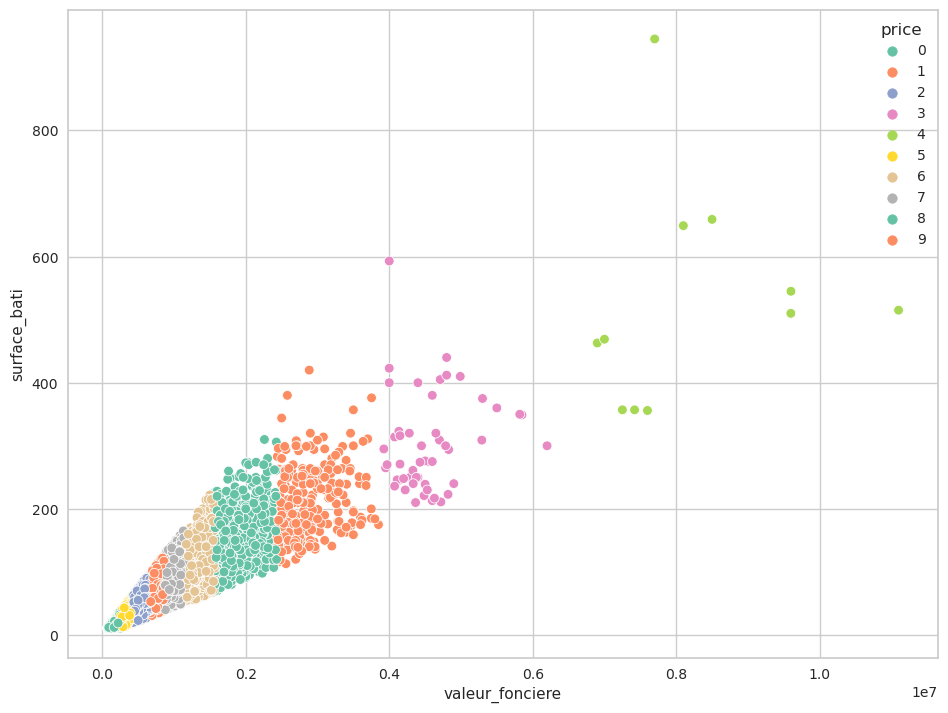

In [140]:
%matplotlib inline
# Set the figure size
plt.figure(figsize=(10, 8))

# Plot the clusters
sns.scatterplot(x='valeur_fonciere', y='surface_bati', hue='price', data=train_min, palette='Set2')

# Show the plot
plt.show()

In [142]:
# for each cluster, get the min and max value of the valeur_fonciere column and create a new column with the range
train_min['price'] = train_min.groupby('price')['valeur_fonciere'].transform(lambda x: str(x.min()) + ' - ' + str(x.max()))

In [143]:
train_min['price'].unique()

array(['74750.0 - 253910.0', '429440.0 - 671650.0', '254000.0 - 429300.0',
       '672000.0 - 873000.0', '873850.0 - 1148000.0',
       '1149525.0 - 1562850.0', '1565000.0 - 2430000.0',
       '2439231.0 - 3850000.0', '3925000.0 - 6200000.0',
       '6900000.0 - 11100000.0'], dtype=object)

In [125]:
# train_min['price'] = pd.qcut(train_min[TARGET2], 10)
train_min = train_min.drop([TARGET2], axis=1)

In [135]:
from pycaret.regression import *
clf1 = setup(data = train_min, 
             target = TARGET2
            )

,Description,Value
0,Session id,1574
1,Target,valeur_fonciere
2,Target type,Regression
3,Original data shape,"(77973, 44)"
4,Transformed data shape,"(77973, 105)"
5,Transformed train set shape,"(54581, 105)"
6,Transformed test set shape,"(23392, 105)"
7,Numeric features,33
8,Date features,1
9,Categorical features,9


In [136]:
best_model = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,62123.2120,14381949023.5979,119149.9445,0.8929,0.1915,0.1558,42.3400
omp,Orthogonal Matching Pursuit,69934.5189,16102408550.2553,126018.1541,0.8804,0.2944,0.1829,0.4790
br,Bayesian Ridge,68814.4189,16327840368.9387,126856.0744,0.8778,0.2840,0.1813,0.9830
ridge,Ridge Regression,68843.3236,16507990392.7933,127513.5575,0.8763,0.2863,0.1816,0.5510
lasso,Lasso Regression,68879.3657,16655976194.8293,128010.3281,0.8753,0.2850,0.1818,6.3980
lr,Linear Regression,68892.4260,16689679704.1344,128127.8901,0.8751,0.2850,0.1819,1.8320
llar,Lasso Least Angle Regression,67914.3519,16998218939.3705,129593.2905,0.8734,0.2392,0.1701,0.4690
en,Elastic Net,70474.2819,19783601228.1783,136603.9483,0.8510,0.2833,0.1827,6.8150
gbr,Gradient Boosting Regressor,105309.0210,29998554634.3989,172487.3615,0.7752,0.3638,0.3457,13.4810
ada,AdaBoost Regressor,140701.9885,36246305431.7115,188980.4642,0.7289,0.4982,0.5503,7.5810


Processing:   0%|          | 0/85 [00:00<?, ?it/s]

In [40]:
from h2o import h2o
from h2o.automl import H2OAutoML
# Start h2o
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /opt/conda/lib/python3.7/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpn8fnmw0o
  JVM stdout: /tmp/tmpn8fnmw0o/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpn8fnmw0o/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.2
H2O_cluster_version_age:,1 month and 11 days
H2O_cluster_name:,H2O_from_python_unknownUser_71hfe8
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,7.500 Gb
H2O_cluster_total_cores:,4
H2O_cluster_allowed_cores:,4
H2O_cluster_status:,"locked, healthy"


In [126]:
# Convert the dataframe to h2o dataframe
df_h2o = h2o.H2OFrame(train_min)

# Select the price column as the target
df_h2o['price'] = df_h2o['price'].asfactor()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [127]:
# Set the parameters
aml = H2OAutoML(seed=2023,
                nfolds = 3,
                max_runtime_secs=100,
               )

# Train the model
aml.train(x=df_h2o.columns, y='price', training_frame=df_h2o)

AutoML progress: |█████████████████████
13:31:52.531: GLM_1_AutoML_6_20230421_133119 [GLM def_1] failed: java.lang.ArrayIndexOutOfBoundsException

██████████████████████████████████████████| (done) 100%


Model Details
=============
H2OXGBoostEstimator : XGBoost
Model Key: XGBoost_1_AutoML_6_20230421_133119


Model Summary: 
    number_of_trees
--  -----------------
    6

ModelMetricsMultinomial: xgboost
** Reported on train data. **

MSE: 0.2643677263152077
RMSE: 0.5141670218082911
LogLoss: 0.7563484457871191
Mean Per-Class Error: 0.3962180856139931
AUC table was not computed: it is either disabled (model parameter 'auc_type' was set to AUTO or NONE) or the domain size exceeds the limit (maximum is 50 domains).
AUCPR table was not computed: it is either disabled (model parameter 'auc_type' was set to AUTO or NONE) or the domain size exceeds the limit (maximum is 50 domains).

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class
1032330.0 - 1433650.0    1434500.0 - 2072200.0    2075000.0 - 3235000.0    234150.0 - 367420.0    3250000.0 - 5850000.0    367490.0 - 531868.0    531890.0 - 744555.0    6200000.0 - 11100000.0    744900.0 - 1032050.0    74750.0 - 234110.0    Error     Rate
-----------------------  -----------------------  -----------------------  ---------------------  -----------------------  ---------------------  ---------------------  ------------------------  ----------------------  --------------------  --------  ---------------
1479                     149                      5                        0                      0                        7                      95                     0                         592                     0                     0.364418  848 / 2,327
282                      732                      50                       0                      0                        0                      3                      0                         63                      0                     0.352212  398 / 1,130
25                       134                      261                      0                      8                        0                      0                      0                         0                       0                     0.390187  167 / 428
0                        0                        0                        17851                  0                        2073                   24                     0                         0                       2456                  0.203223  4,553 / 22,404
1                        3                        55                       0                      40                       0                      0                      0                         0                       0                     0.59596   59 / 99
0                        0                        0                        2717                   0                        10946                  1199                   0                         43                      84                    0.269731  4,043 / 14,989
26                       0                        0                        115                    0                        1906                   5758                   0                         651                     1                     0.319144  2,699 / 8,457
0                        0                        4                        0                      8                        0                      0                      0                         0                       0                     1         12 / 12
369                      20                       0                        7                      0                        127                    1084                   0                         2854                    0                     0.360233  1,607 / 4,461
0                        0                        0                        2519                   0                        15                     0                      0                         0                       21132                 0.107073  2,534 / 23,666
2182                     1038                     375                      23209   

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,mean_per_class_error,logloss,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
XGBoost_1_AutoML_6_20230421_133119,0.396218,0.756348,0.514167,0.264368,10599,0.002501,XGBoost
StackedEnsemble_BestOfFamily_1_AutoML_6_20230421_133119,0.438798,0.647144,0.46694,0.218033,19565,0.01865,StackedEnsemble
GBM_1_AutoML_6_20230421_133119,0.464668,1.11889,0.65371,0.427336,10212,0.012083,GBM


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## XGBoost_1_AutoML_6_20230421_133119

1032330.0 - 1433650.0,1434500.0 - 2072200.0,2075000.0 - 3235000.0,234150.0 - 367420.0,3250000.0 - 5850000.0,367490.0 - 531868.0,531890.0 - 744555.0,6200000.0 - 11100000.0,744900.0 - 1032050.0,74750.0 - 234110.0,Error,Rate
1479.0,149.0,5.0,0.0,0.0,7.0,95.0,0.0,592.0,0.0,0.3644177,"848 / 2,327"
282.0,732.0,50.0,0.0,0.0,0.0,3.0,0.0,63.0,0.0,0.3522124,"398 / 1,130"
25.0,134.0,261.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.3901869,167 / 428
0.0,0.0,0.0,17851.0,0.0,2073.0,24.0,0.0,0.0,2456.0,0.2032226,"4,553 / 22,404"
1.0,3.0,55.0,0.0,40.0,0.0,0.0,0.0,0.0,0.0,0.5959596,59 / 99
0.0,0.0,0.0,2717.0,0.0,10946.0,1199.0,0.0,43.0,84.0,0.2697311,"4,043 / 14,989"
26.0,0.0,0.0,115.0,0.0,1906.0,5758.0,0.0,651.0,1.0,0.3191439,"2,699 / 8,457"
0.0,0.0,4.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,1.0,12 / 12
369.0,20.0,0.0,7.0,0.0,127.0,1084.0,0.0,2854.0,0.0,0.3602331,"1,607 / 4,461"
0.0,0.0,0.0,2519.0,0.0,15.0,0.0,0.0,0.0,21132.0,0.1070734,"2,534 / 23,666"


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

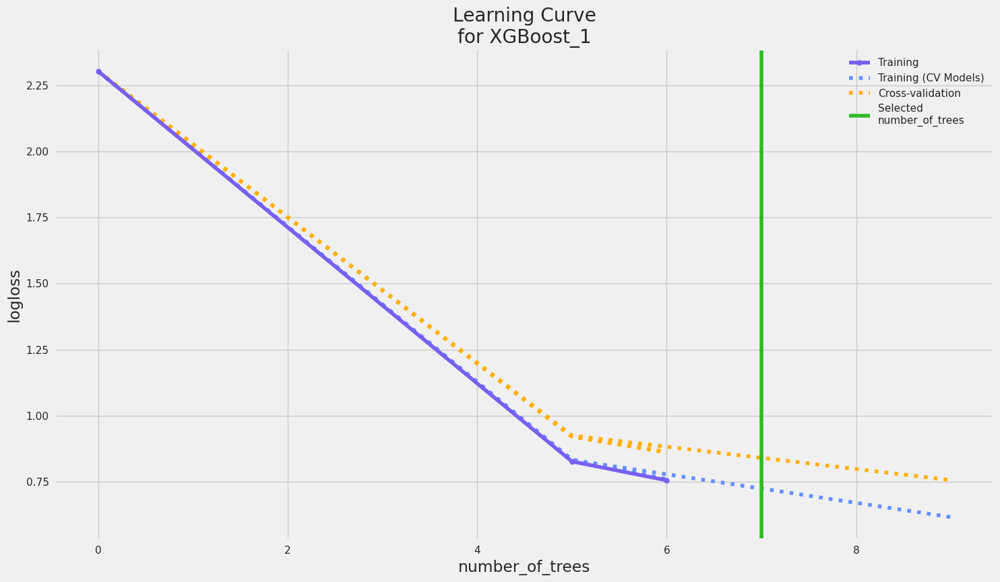

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

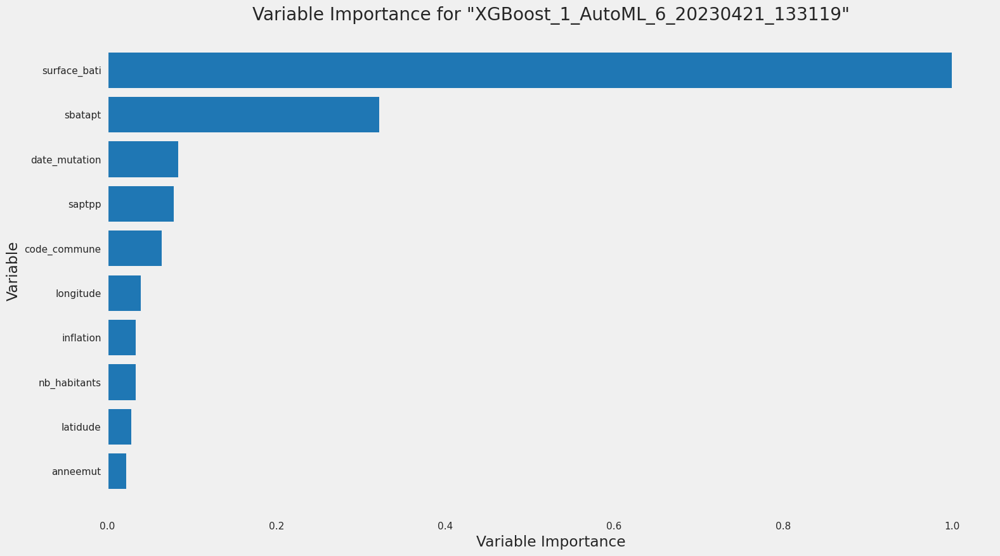

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

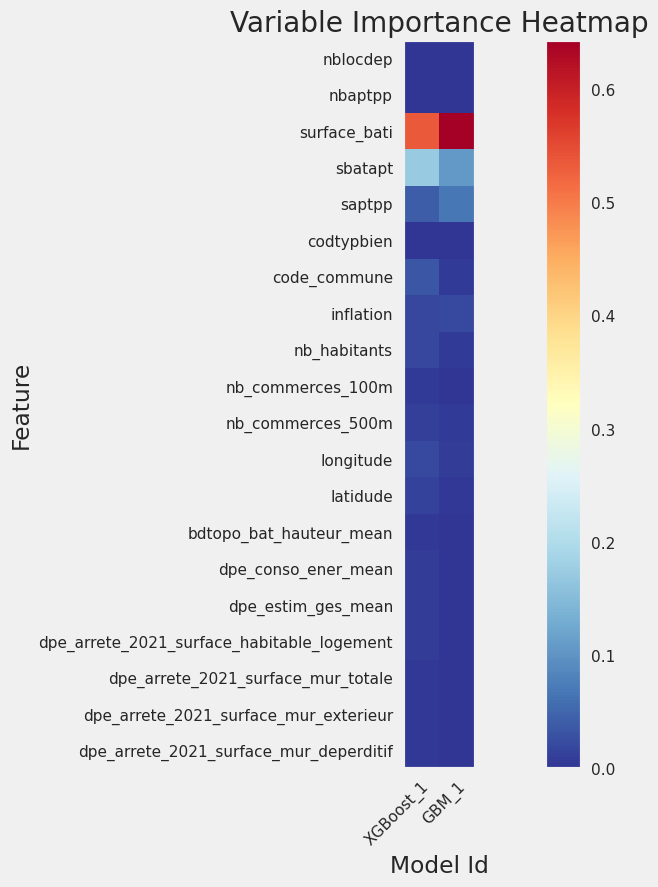

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

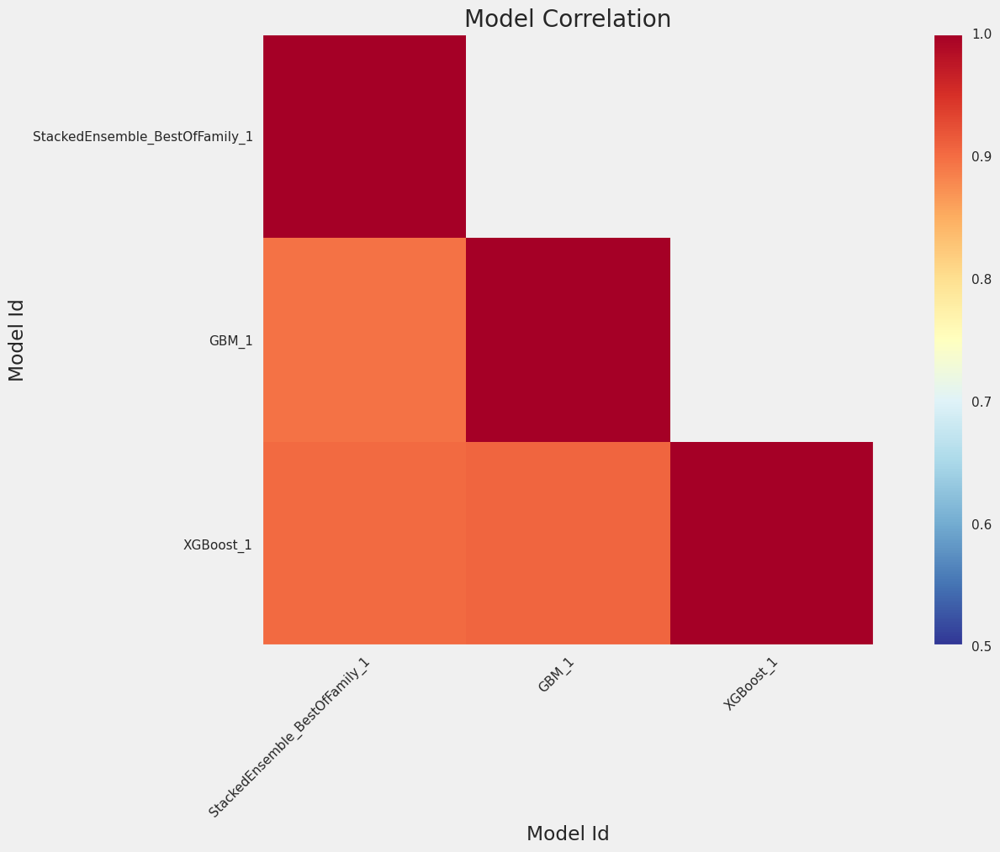

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

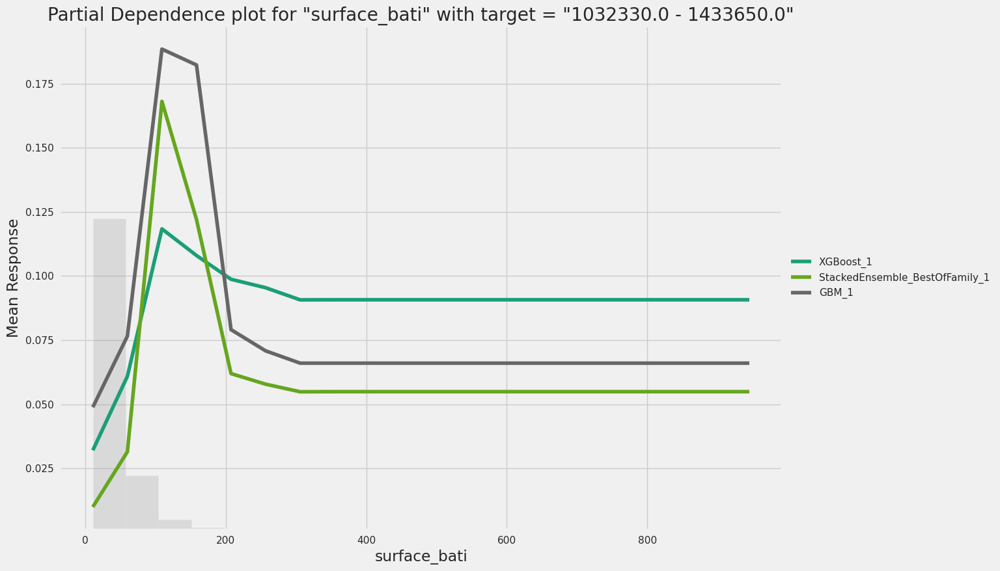

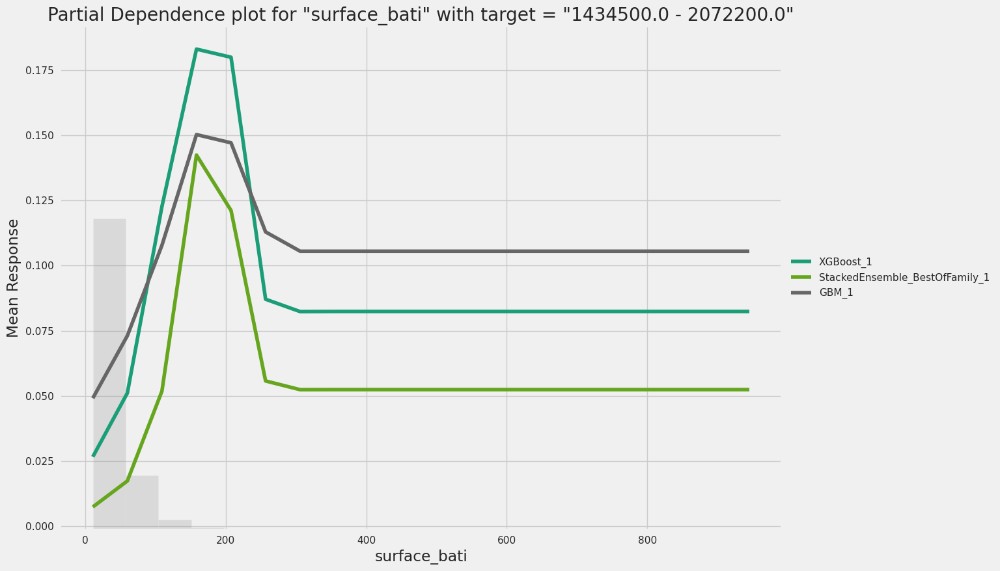

H2OJobCancelled: Job<$03017f00000132d4ffffffff$_b27c49f8cf0c38f92a9ba6717d0245a3> was cancelled by the user.

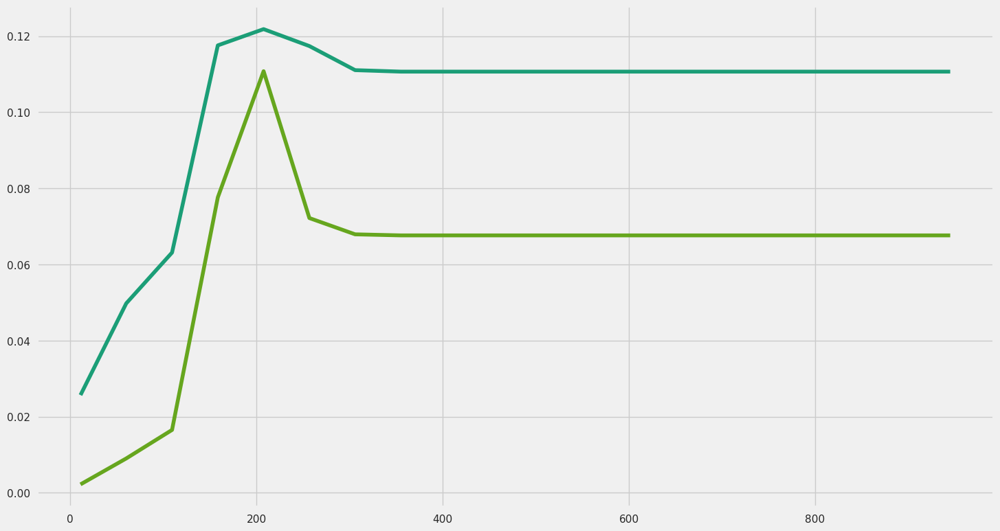

In [128]:
aml.explain(df_h2o)

In [199]:
# Get the leaderboard
lb = aml.leaderboard
lb.head(rows=lb.nrows)

model_id,mean_per_class_error,logloss,rmse,mse
StackedEnsemble_BestOfFamily_1_AutoML_9_20230420_192859,0.00888706,0.027644,0.0858557,0.0073712
XGBoost_1_AutoML_9_20230420_192859,0.00963158,0.0654795,0.111533,0.0124397
GBM_1_AutoML_9_20230420_192859,0.0108355,0.067135,0.117748,0.0138645


<a id="section-6"></a>
# <div style="color:#fff;display:fill;border-radius:10px;background-color:#3c968b;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:20px;color:white;overflow:hidden;margin:0;font-size:100%">🎲 Predictions</div> 


In [ ]:
# Take the best model
model = aml.leader

# Predict the test data
pred = model.predict(df_h2o_test)

<a id="section-7"></a>
# <div style="color:#fff;display:fill;border-radius:10px;background-color:#3c968b;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:20px;color:white;overflow:hidden;margin:0;font-size:100%">💾 Save the work</div> 


#### Save the predictions

In [ ]:
# Convert the h2o dataframe to pandas dataframe
pred_df = pred.as_data_frame()

# Get the predictions
y_pred_df = pred_df['predict'].values
y_test_df = df_h2o_test[TARGET].as_data_frame().values

In [ ]:
# Get the classification report in a dataframe
report = classification_report(y_test_df, y_pred_df, output_dict=True)
report = pd.DataFrame(report).transpose()
report

In [ ]:
# Get the confusion matrix plot
cm = confusion_matrix(y_test_df, y_pred_df)
sns.heatmap(cm, annot=True, fmt='d')
plt.show()

In [ ]:
# Export the predictions in a txt file with in the first line the ID = "700641" and the second line are the positive and negative class predictions represented by 0 and 1 in the sameorder as the pairs points from the csv
# print the first 10 predictions
print(y_pred_df[:10])
# convert y_pred NO to 0 and 1 to YES
y_pred_2 = np.where(y_pred_df == 'NO', 0, 1)
# print the first 10 predictions
print(y_pred_2[:10])
# to string with a space between each element
y_pred_2 = ' '.join(y_pred_2.astype(str))
# print the first 10 predictions
print(y_pred_2[:10])
# ID before the predictions and a new line
y_pred_2 = '700641' + '\n' + y_pred_2
# save the predictions in a txt file
with open('/kaggle/working/prediction.txt', 'w') as f:
    f.write(y_pred_2)

#### Save the model

In [ ]:
# h2o.save_model(aml.leader, path = "./product_backorders_model_bin")

Explain the best model :

In [ ]:
# get the best xgboost model
xgb = aml.get_best_model(algorithm="xgboost")

In [ ]:
xgb.explain(df_h2o)